In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import unicodedata
from wordcloud import WordCloud
import spacy
import regex as re


# Import data

In [2]:
real = pd.read_csv('True.csv')
fake = pd.read_csv('Fake.csv')

In [3]:
real

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"
...,...,...,...,...
21412,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017"
21413,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017"
21414,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017"
21415,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017"


In [4]:
fake

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"
...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016"
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016"
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016"
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016"


In [5]:
# combine both dataset into one
real['real_or_fake'] = 'real'
fake['real_or_fake'] = 'fake'
df = pd.concat([real,fake], axis=0, ignore_index=True)
df

,title,text,subject,date,real_or_fake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",real
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",real
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",real
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",real
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",real
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",fake
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",fake
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",fake
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",fake


# Data cleaning

In [6]:
# Check na
df.isnull().sum()

title           0
text            0
subject         0
date            0
real_or_fake    0
dtype: int64

In [7]:
df.describe()

,title,text,subject,date,real_or_fake
count,44898,44898,44898,44898,44898
unique,38729,38646,8,2397,2
top,Factbox: Trump fills top jobs for his administ...,,politicsNews,"December 20, 2017",fake
freq,14,627,11272,182,23481


In [8]:
df.dtypes

title           object
text            object
subject         object
date            object
real_or_fake    object
dtype: object

In [9]:
df.isnull().sum()

title           0
text            0
subject         0
date            0
real_or_fake    0
dtype: int64

In [10]:
df['title'] = df['title'].str.strip()
df['text'] = df['text'].str.strip()

In [11]:
df.isin(['', ' ']).sum()

title             0
text            631
subject           0
date              0
real_or_fake      0
dtype: int64

In [12]:
# Drop rows with blank text
df = df[df['text'].isin(['', ' ']) == False]
df

,title,text,subject,date,real_or_fake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",real
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",real
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",real
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",real
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",real
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",fake
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",fake
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",fake
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",fake


In [13]:
# Check text
df.iloc[7,1]

'The following statements\xa0were posted to the verified Twitter accounts of U.S. President Donald Trump, @realDonaldTrump and @POTUS.  The opinions expressed are his own.\xa0Reuters has not edited the statements or confirmed their accuracy.  @realDonaldTrump : - While the Fake News loves to talk about my so-called low approval rating, @foxandfriends just showed that my rating on Dec. 28, 2017, was approximately the same as President Obama on Dec. 28, 2009, which was 47%...and this despite massive negative Trump coverage & Russia hoax! [0746 EST] - Why is the United States Post Office, which is losing many billions of dollars a year, while charging Amazon and others so little to deliver their packages, making Amazon richer and the Post Office dumber and poorer? Should be charging MUCH MORE! [0804 EST] -- Source link: (bit.ly/2jBh4LU) (bit.ly/2jpEXYR)'

In [14]:
# standardize string encoding 
df["text"] = df["text"].map(lambda x: unicodedata.normalize('NFKD', x))

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/3636753554.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["text"] = df["text"].map(lambda x: unicodedata.normalize('NFKD', x))


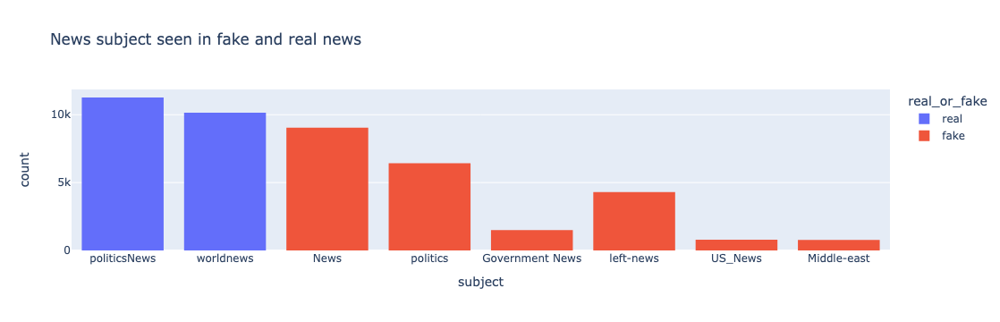

In [15]:
# Subject in news
fig = px.histogram(df, x="subject", color="real_or_fake", title="News subject seen in fake and real news")
fig.show()

In [16]:
# Check date 
sorted(df['date'].str.strip().unique())

['14-Feb-18',
 '15-Feb-18',
 '16-Feb-18',
 '17-Feb-18',
 '18-Feb-18',
 '19-Feb-18',
 'Apr 1, 2015',
 'Apr 1, 2016',
 'Apr 1, 2017',
 'Apr 10, 2015',
 'Apr 10, 2016',
 'Apr 10, 2017',
 'Apr 11, 2015',
 'Apr 11, 2016',
 'Apr 11, 2017',
 'Apr 12, 2015',
 'Apr 12, 2016',
 'Apr 12, 2017',
 'Apr 13, 2015',
 'Apr 13, 2016',
 'Apr 13, 2017',
 'Apr 14, 2015',
 'Apr 14, 2016',
 'Apr 14, 2017',
 'Apr 15, 2015',
 'Apr 15, 2016',
 'Apr 15, 2017',
 'Apr 16, 2015',
 'Apr 16, 2016',
 'Apr 16, 2017',
 'Apr 17, 2015',
 'Apr 17, 2016',
 'Apr 17, 2017',
 'Apr 18, 2015',
 'Apr 18, 2016',
 'Apr 18, 2017',
 'Apr 19, 2015',
 'Apr 19, 2016',
 'Apr 19, 2017',
 'Apr 2, 2015',
 'Apr 2, 2016',
 'Apr 2, 2017',
 'Apr 20, 2015',
 'Apr 20, 2016',
 'Apr 20, 2017',
 'Apr 21, 2015',
 'Apr 21, 2016',
 'Apr 21, 2017',
 'Apr 22, 2015',
 'Apr 22, 2016',
 'Apr 22, 2017',
 'Apr 23, 2015',
 'Apr 23, 2016',
 'Apr 23, 2017',
 'Apr 24, 2015',
 'Apr 24, 2016',
 'Apr 24, 2017',
 'Apr 25, 2015',
 'Apr 25, 2016',
 'Apr 25, 2017',
 'Ap

In [17]:
sorted(df['date'].str.strip().str[-4:].unique())

['.jpg', '2015', '2016', '2017', 'b-18', 'deo]', 'eft/', 'ier/', 'pie/']

In [18]:
# real news - year of publication
sorted(real['date'].str.strip().str[-4:].unique())

['2016', '2017']

In [19]:
# fake news - year of publication

sorted(fake['date'].str.strip().str[-4:].unique())

['.jpg', '2015', '2016', '2017', 'b-18', 'deo]', 'eft/', 'ier/', 'pie/']

In [20]:
fake[fake['date'].str.contains('.jpg|deo]|eft/|ier/|pie/')]

,title,text,subject,date,real_or_fake
9358,https://100percentfedup.com/served-roy-moore-v...,https://100percentfedup.com/served-roy-moore-v...,politics,https://100percentfedup.com/served-roy-moore-v...,fake
15507,https://100percentfedup.com/video-hillary-aske...,https://100percentfedup.com/video-hillary-aske...,politics,https://100percentfedup.com/video-hillary-aske...,fake
15508,https://100percentfedup.com/12-yr-old-black-co...,https://100percentfedup.com/12-yr-old-black-co...,politics,https://100percentfedup.com/12-yr-old-black-co...,fake
15839,https://fedup.wpengine.com/wp-content/uploads/...,https://fedup.wpengine.com/wp-content/uploads/...,politics,https://fedup.wpengine.com/wp-content/uploads/...,fake
15840,https://fedup.wpengine.com/wp-content/uploads/...,https://fedup.wpengine.com/wp-content/uploads/...,politics,https://fedup.wpengine.com/wp-content/uploads/...,fake
17432,https://fedup.wpengine.com/wp-content/uploads/...,https://fedup.wpengine.com/wp-content/uploads/...,Government News,https://fedup.wpengine.com/wp-content/uploads/...,fake
17433,https://fedup.wpengine.com/wp-content/uploads/...,https://fedup.wpengine.com/wp-content/uploads/...,Government News,https://fedup.wpengine.com/wp-content/uploads/...,fake
18933,Homepage,[vc_row][vc_column width= 1/1 ][td_block_trend...,left-news,MSNBC HOST Rudely Assumes Steel Worker Would N...,fake
21869,https://fedup.wpengine.com/wp-content/uploads/...,https://fedup.wpengine.com/wp-content/uploads/...,left-news,https://fedup.wpengine.com/wp-content/uploads/...,fake
21870,https://fedup.wpengine.com/wp-content/uploads/...,https://fedup.wpengine.com/wp-content/uploads/...,left-news,https://fedup.wpengine.com/wp-content/uploads/...,fake


In [21]:
# drop these rows with dates of weird formats since the title and text are website links 
df = df[df['date'].str.contains('.jpg|deo]|eft/|ier/|pie/') == False]
df

,title,text,subject,date,real_or_fake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",real
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",real
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",real
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",real
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",real
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",fake
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",fake
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",fake
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",fake


In [22]:
fake[fake['date'].str.contains('2015|b-18')]

,title,text,subject,date,real_or_fake
9050,Democrat Senator Warns Mueller Not To Release ...,"According to The Hill, Democrat Senator Bob Ca...",politics,19-Feb-18,fake
9051,MSNBC ANCHOR Flabbergasted at What Texas Teach...,If we protect every other government building ...,politics,19-Feb-18,fake
9052,WATCH: SNOWFLAKES ASKED Communist Party Platfo...,Ami Horowitz is fantastic! Check out this man ...,politics,19-Feb-18,fake
9053,JUST IN: BADASS GENERAL JOHN KELLY Shoved Chin...,Just one more reminder of why President Trump ...,politics,18-Feb-18,fake
9054,DOJ’s JEFF SESSIONS Opens Investigation Into W...,Thank goodnesss Jeff Sessions is moving on fin...,politics,18-Feb-18,fake
...,...,...,...,...,...
21915,ENTITLED IRS ETHICS LAWYER DISBARRED FOR ETHIC...,Don t you just love an entitled IRS lawyer who...,left-news,"Apr 4, 2015",fake
21916,[VIDEO] 16 YR OLD ARRESTED For Violent Gang Be...,This is a sad commentary on a generation who h...,left-news,"Apr 4, 2015",fake
21917,“Non-violence hasn’t worked”…Reverend Sam Most...,Yeah that whole taking up arms thing seems t...,left-news,"Apr 1, 2015",fake
21918,WATCH DIRTY HARRY REID ON HIS LIE ABOUT ROMNEY...,"In case you missed it Sen. Harry Reid (R-NV), ...",left-news,"Mar 31, 2015",fake


In [23]:
# drop these rows with year 2015 or 2018 since real news dont have data from these years 
df = df[df['date'].str.contains('2015|b-18') == False]
df

,title,text,subject,date,real_or_fake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",real
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",real
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",real
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",real
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",real
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",fake
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",fake
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",fake
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",fake


In [24]:
# Drop date and subject column since they will not be used for modelling
df.drop(['subject', 'date'], axis=1, inplace=True)
df.reset_index(inplace=True, drop=True)
df

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/577098145.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,title,text,real_or_fake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real
...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake


In [25]:
# common phrase in text: reuters name at the start before actual text 

count = 0
for index,row in enumerate(df['text'].values):
    if row.find("Reuters) - ") >= 0:
        position = row.find("Reuters) - ")
        df.loc[index, 'common'] = row[:position+len("Reuters) - ")]
        count += 1

print('no. of news from reuters', count, count/len(real.index))
df

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/2742109175.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/2742109175.py:7: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'WASHINGTON (Reuters) - ' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



no. of news from reuters 21248 0.9921090722323388


,title,text,real_or_fake,common
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real,WASHINGTON (Reuters) -
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real,WASHINGTON (Reuters) -
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real,WASHINGTON (Reuters) -
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real,WASHINGTON (Reuters) -
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real,SEATTLE/WASHINGTON (Reuters) -
...,...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake,NaN
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake,NaN
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake,NaN
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake,NaN


In [26]:
# check that the above has correctly filtered out reuters publications 

def count_words(row):
    if isinstance(row, str) :
        return len(row.split())
        

df['count'] = df['common'].apply(count_words)
sorted(df['count'].unique())

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/1339311702.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



[3.0,
 6.0,
 nan,
 2.0,
 4.0,
 5.0,
 7.0,
 8.0,
 9.0,
 11.0,
 12.0,
 13.0,
 14.0,
 15.0,
 17.0,
 18.0,
 19.0,
 20.0,
 21.0,
 22.0,
 23.0,
 24.0,
 25.0,
 26.0,
 27.0,
 28.0,
 29.0,
 30.0,
 31.0,
 32.0,
 33.0,
 34.0,
 35.0,
 36.0,
 38.0,
 41.0]

In [27]:
df[df['count'] >30]

,title,text,real_or_fake,common,count
838,Republican tax plan a blow to Democratic state...,(This version of the Nov. 2 story corrects par...,real,(This version of the Nov. 2 story corrects par...,34.0
1146,Trump 'committed' to U.S. renewable fuels: Iow...,(This story corrects ninth paragraph to say th...,real,(This story corrects ninth paragraph to say th...,32.0
1522,U.S. seeks up to 27 months in prison for ex-Co...,(This version of the Sept. 20 story corrects t...,real,(This version of the Sept. 20 story corrects t...,32.0
1523,Ex-U.S. congressman Weiner seeks to avoid pris...,(This version of the Sept. 14 story corrects t...,real,(This version of the Sept. 14 story corrects t...,33.0
2102,Fellow Republicans assail Trump after he defen...,(Corrects Corker quote in paragraph 4 of Aug. ...,real,(Corrects Corker quote in paragraph 4 of Aug. ...,33.0
2510,U.S. senators seek ban on pesticide chlorpyrifos,(This version of the July 25 story corrects pa...,real,(This version of the July 25 story corrects pa...,35.0
3466,U.S. coal stocks fall; exit from climate deal ...,(This version of the May 31st story removes fo...,real,(This version of the May 31st story removes fo...,31.0
3615,Texas House passes 'bathroom bill' targeting p...,(This version of the May 22 story was correcte...,real,(This version of the May 22 story was correcte...,35.0
3976,Republicans begin final push on killing Obama-...,"(In April 27 story, corrects name of Republica...",real,"(In April 27 story, corrects name of Republica...",38.0
5246,"Kuwait could pay up to $60,000 for party at Tr...",(Corrects Feb. 25 story to show event took pla...,real,(Corrects Feb. 25 story to show event took pla...,36.0


In [28]:
df.drop(['count'], axis=1, inplace=True)
df

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/1947247742.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,title,text,real_or_fake,common
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real,WASHINGTON (Reuters) -
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real,WASHINGTON (Reuters) -
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real,WASHINGTON (Reuters) -
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real,WASHINGTON (Reuters) -
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real,SEATTLE/WASHINGTON (Reuters) -
...,...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake,NaN
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake,NaN
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake,NaN
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake,NaN


In [29]:
# common phrase in text: verified twitter accounts

count = 0

for index,row in enumerate(df['text'].values):
    if row.find("The following statements were posted to the verified Twitter accounts") >= 0:
        position = row.find("The following statements were posted to the verified Twitter accounts")
        df.loc[index, 'common'] = row[:position+len("The following statements were posted to the verified Twitter accounts")]
        count += 1

print('no. of news from twitter account', count)
df



no. of news from twitter account 95


,title,text,real_or_fake,common
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real,WASHINGTON (Reuters) -
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real,WASHINGTON (Reuters) -
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real,WASHINGTON (Reuters) -
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real,WASHINGTON (Reuters) -
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real,SEATTLE/WASHINGTON (Reuters) -
...,...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake,NaN
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake,NaN
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake,NaN
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake,NaN


In [30]:
real_df = df[df['real_or_fake'] == 'real']
fake_df = df[df['real_or_fake'] == 'fake']

In [31]:
real_df['common'].isnull().sum()

73

In [32]:
# See what are the other real news that dont have common phrases
real_df[real_df['common'].isnull()].iloc[:20,1]

103     WASHINGTON () - The top Democrat on the Senate...
231     WASHINGTON (Reuters on Friday ) - U.S. Special...
272     NEW YORK (LPC/IFR) - U.S. regulators said they...
427     WASHINGTON - Some key U.S. senators still had ...
1141    NEW YORK (IFR) - The investigative arm of Cong...
3488    The White House on Wednesday disclosed a group...
4077    SYDNEY/WASHINGTON (Reuters)) - U.S. President ...
4358    Neil Gorsuch, President Donald Trump’s appoint...
4465    WASHINGTON The clock began running out this we...
5363    ABU DHABI - U.S. President Donald Trump’s defe...
5761    The following bullet points are from the U.S. ...
5784    Federal appeals court judge Neil Gorsuch, the ...
5796    The following bullet points are from the U.S. ...
5821    NEW YORK (IFR) - Jared Kushner has divested hi...
6026    The following bullet points are from the U.S. ...
6089    NEW YORK (Thomson Reuters Foundation) - U.S. P...
6184    The following bullet points are from the U.S. ...
6313    DAVOS,

In [33]:
real_df[real_df['common'].isnull()].iloc[-1,1]

'TOKYO - Tokyo Governor Yuriko Koike has made no secret of her desire to be Japan s first female prime minister - she even named her pet terrier  Sori , Japanese for  premier . But Koike, 65, whose fledgling Party of Hope poses a growing threat to Prime Minister Shinzo Abe s ruling bloc in an election this month, faces a tough choice: run now for a seat in parliament to become eligible for the top job, or wait and bet her party positions itself to win the next national poll. Abe called the Oct. 22 poll in hopes his Liberal Democratic Party-led bloc could keep its majority in the lower house, where it now holds a two-thirds  super majority , but Koike s party has upended forecasts.  If Koike resigns as governor little more than a year after defying Abe s LDP to run successfully for that post, she would risk a backlash from voters. Waiting might let her best shot at the premiership slip through her fingers.  If she thinks of the nation, it is important that she boldly announce her candid

In [34]:
# check if fake news has the same phrases as real news
fake_df[fake_df['common'].isnull() == False]

,title,text,real_or_fake,common


In [35]:
fake_df.iloc[:20,1]

21416    Donald Trump just couldn t wish all Americans ...
21417    House Intelligence Committee Chairman Devin Nu...
21418    On Friday, it was revealed that former Milwauk...
21419    On Christmas day, Donald Trump announced that ...
21420    Pope Francis used his annual Christmas Day mes...
21421    The number of cases of cops brutalizing and ki...
21422    Donald Trump spent a good portion of his day a...
21423    In the wake of yet another court decision that...
21424    Many people have raised the alarm regarding th...
21425    Just when you might have thought we d get a br...
21426    A centerpiece of Donald Trump s campaign, and ...
21427    Republicans are working overtime trying to sel...
21428    Republicans have had seven years to come up wi...
21429    The media has been talking all day about Trump...
21430    Abigail Disney is an heiress with brass ovarie...
21431    Donald Trump just signed the GOP tax scam into...
21432    A new animatronic figure in the Hall of Presid.

In [36]:
fake_df.iloc[0,1]

'Donald Trump just couldn t wish all Americans a Happy New Year and leave it at that. Instead, he had to give a shout out to his enemies, haters and  the very dishonest fake news media.  The former reality show star had just one job to do and he couldn t do it. As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year,  President Angry Pants tweeted.  2018 will be a great year for America! As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year. 2018 will be a great year for America!  Donald J. Trump (@realDonaldTrump) December 31, 2017Trump s tweet went down about as welll as you d expect.What kind of president sends a New Year s greeting like this despicable, petty, infantile gibberish? Only Trump! His lack of decency won t ev

Analysis: Fake news doesnt have the reuters publication name or the 'verified twitter account' text seen in real news

In [37]:
# Count the occurrences of the letter "a"
fake_df['count'] = df['text'].apply(lambda x: x.count('@'))
real_df['count'] = df['text'].apply(lambda x: x.count('@'))

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/845258061.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/845258061.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



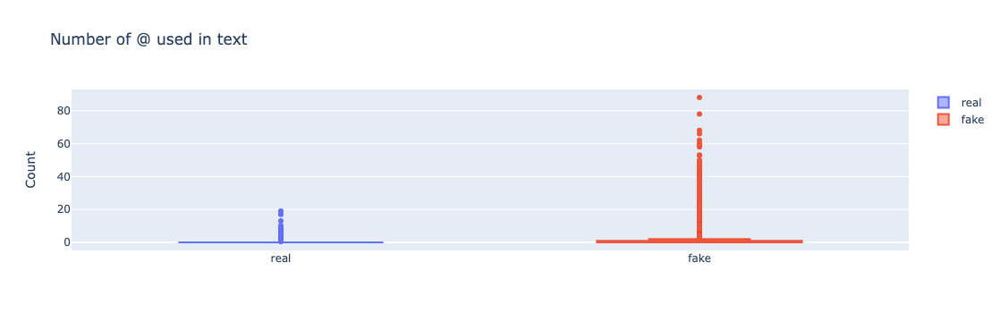

In [38]:
# Number of @ used

fig = go.Figure()
fig.add_trace(go.Box(y=real_df['count'], name="real",))
fig.add_trace(go.Box(y=fake_df['count'], name="fake"))

fig.update_layout(
    title = 'Number of @ used in text',
    yaxis_title="Count"
)
fig.show()

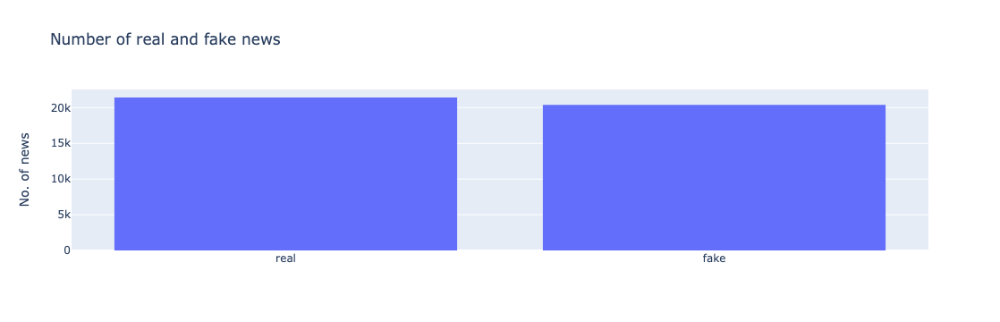

In [39]:
# Number of real and fake news
fig = px.histogram(df, x="real_or_fake", title="Number of real and fake news")

fig.update_layout(
    yaxis_title="No. of news",
    xaxis_title=""
)

fig.show()

In [40]:
# percentage of real news 
len(real_df.index)/len(df.index)

0.5122954741173094

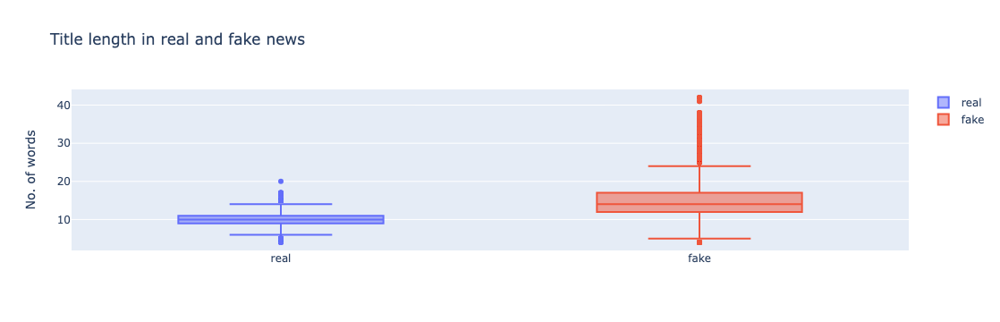

In [41]:
# real and fake news: title length

real_title_len = real_df['title'].str.split().apply(len)
fake_title_len = fake_df['title'].str.split().apply(len)

# Number of real and fake news
fig = go.Figure()
fig.add_trace(go.Box(y=real_title_len, name="real"))
fig.add_trace(go.Box(y=fake_title_len, name="fake"))

fig.update_layout(
    title = 'Title length in real and fake news',
    yaxis_title="No. of words"
)
fig.show()


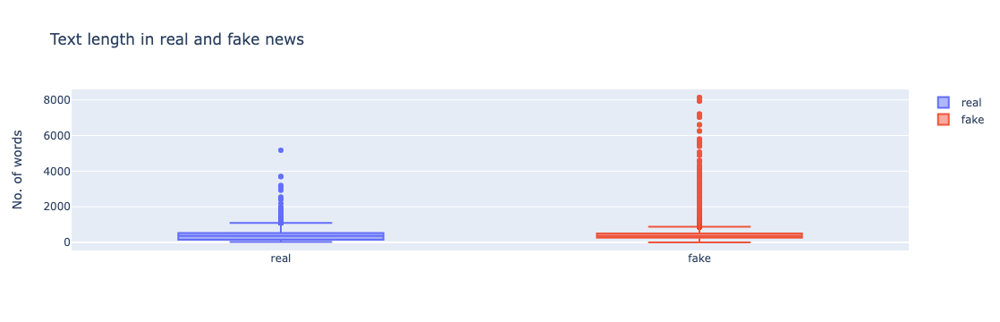

In [42]:
# real and fake news: text length

real_title_len = real_df['text'].str.split().apply(len)
fake_title_len = fake_df['text'].str.split().apply(len)

# Number of real and fake news
fig = go.Figure()
fig.add_trace(go.Box(y=real_title_len, name="real",))
fig.add_trace(go.Box(y=fake_title_len, name="fake"))

fig.update_layout(
    title = 'Text length in real and fake news',
    yaxis_title="No. of words"
)

fig.show()


In [43]:
# create function to count words with title or upper cases
def count_title_case(text):
    count = 0
    list_words = text.split()
    for i in list_words:
        if i.istitle():
            count += 1
    
    return round(count/len(list_words),2)


def count_upper_case(text):
    count = 0
    list_words = text.split()
    for i in list_words:
        if i.isupper():
            count += 1
    return round(count/len(list_words),2) 

In [44]:
# get ratio of title cases and upper cases in title and text

df['word_istitle_in_title'] = df['title'].apply(count_title_case)
df['word_istitle_in_text'] = df['text'].apply(count_title_case)

df['word_isupper_in_title'] = df['title'].apply(count_upper_case)
df['word_isupper_in_text'] = df['text'].apply(count_upper_case)

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/3068113224.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/3068113224.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/3068113224.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

In [45]:
df

,title,text,real_or_fake,common,word_istitle_in_title,word_istitle_in_text,word_isupper_in_title,word_isupper_in_text
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real,WASHINGTON (Reuters) -,0.30,0.16,0.10,0.02
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real,WASHINGTON (Reuters) -,0.33,0.14,0.11,0.01
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real,WASHINGTON (Reuters) -,0.60,0.19,0.10,0.02
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real,WASHINGTON (Reuters) -,0.22,0.22,0.22,0.01
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real,SEATTLE/WASHINGTON (Reuters) -,0.36,0.15,0.00,0.02
...,...,...,...,...,...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake,NaN,0.70,0.14,0.10,0.04
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake,NaN,0.50,0.11,0.17,0.03
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake,NaN,0.71,0.14,0.07,0.02
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake,NaN,0.75,0.14,0.00,0.05


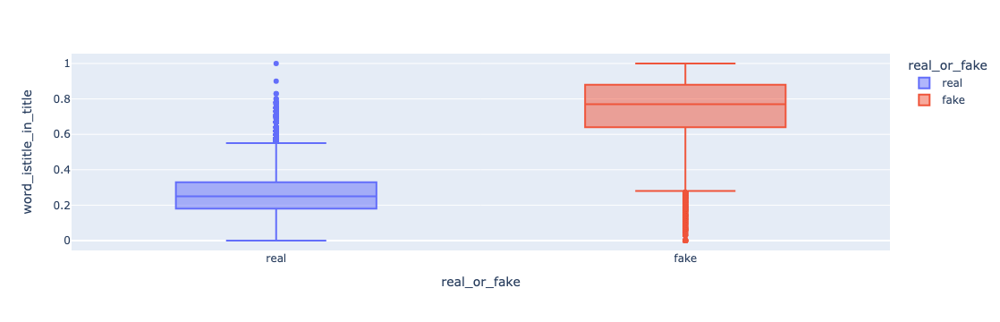

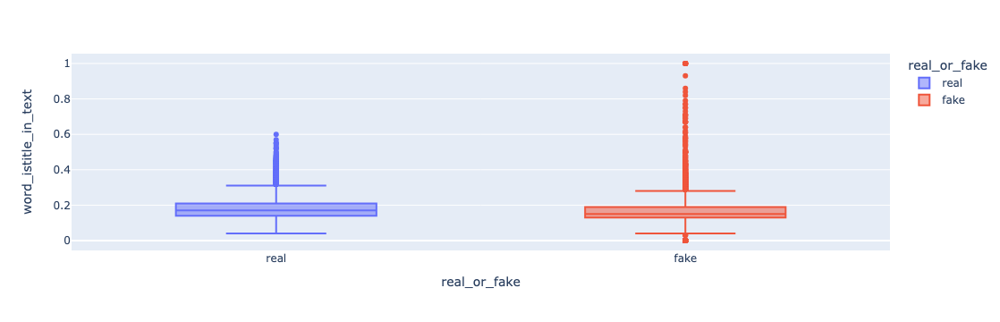

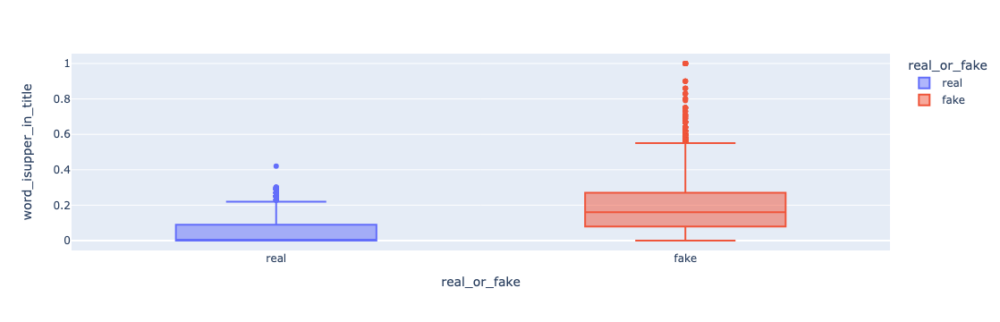

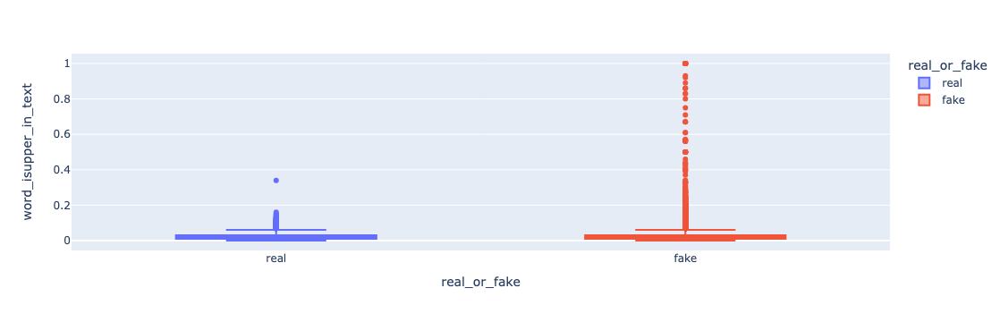

In [46]:
# compare fake and real news based on ratio of title cases and upper cases in title and text 
columns = df.columns[-4:]
for i in columns: 
    fig = px.box(df, x="real_or_fake", y=i, color = 'real_or_fake')
    fig.show()

In [47]:
# drop unwanted roles for modelling
df.drop(df.columns[3:], axis=1, inplace=True)

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/391829865.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [48]:
df

,title,text,real_or_fake
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real
...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake


# Tokenise title and text using SpaCy

In [49]:
# load spacy 
nlp = spacy.load('en_core_web_sm')

In [50]:
# prepare the text 

def clean_text(text):
    # reduce multiple spaces and newlines to only one
    text = re.sub(r'(\s\s+|\n\n+)', r'\1', text)
    # remove double quotes
    text = re.sub(r'"', '', text)
    return text

def convert_text(text):
    text_list=[]
    text_spacy = nlp(text)
    for t in text_spacy:
        if not (t.is_stop | t.is_punct):
            text_list.append(t.lemma_)

    text = ' '.join(str(x) for x in text_list)
    return text


In [51]:
df['title_cleaned'] = df['title'].apply(clean_text).apply(convert_text)
df

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/3367434015.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,title,text,real_or_fake,title_cleaned
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real,U.S. budget fight loom Republicans flip fiscal...
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real,U.S. military accept transgender recruit Monda...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real,senior U.S. republican senator let Mr. Mueller...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real,FBI Russia probe help australian diplomat tip NYT
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real,trump want Postal Service charge Amazon shipment
...,...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake,mcpain John McCain Furious Iran Treated sailor
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake,justice Yahoo Settles e mail Privacy Class act...
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake,Sunnistan Allied Safe Zone plan Territorial Bo...
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake,blow $ 700 million Al Jazeera America finally ...


In [52]:
df['text_cleaned'] = df['text'].apply(clean_text).apply(convert_text)
df

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/2720639666.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,title,text,real_or_fake,title_cleaned,text_cleaned
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real,U.S. budget fight loom Republicans flip fiscal...,WASHINGTON Reuters head conservative republica...
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real,U.S. military accept transgender recruit Monda...,WASHINGTON Reuters Transgender people allow ti...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real,senior U.S. republican senator let Mr. Mueller...,WASHINGTON Reuters special counsel investigati...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real,FBI Russia probe help australian diplomat tip NYT,WASHINGTON Reuters trump campaign adviser Geor...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real,trump want Postal Service charge Amazon shipment,SEATTLE WASHINGTON Reuters President Donald Tr...
...,...,...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake,mcpain John McCain Furious Iran Treated sailor,21st Century Wire say 21wire report early week...
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake,justice Yahoo Settles e mail Privacy Class act...,21st Century Wire say s familiar theme dispute...
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake,Sunnistan Allied Safe Zone plan Territorial Bo...,Patrick Henningsen 21st Century WireRemember...
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake,blow $ 700 million Al Jazeera America finally ...,21st Century Wire say Al Jazeera America histo...


# Word Cloud - title and text

In [53]:
real_df = df[df['real_or_fake'] == 'real']
fake_df = df[df['real_or_fake'] == 'fake']

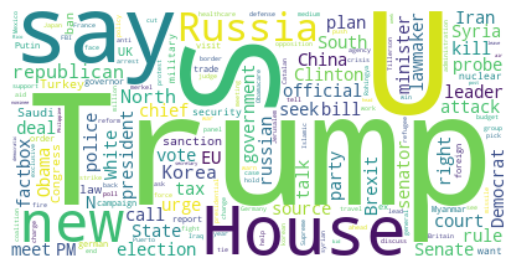

In [54]:
# Real news title word cloud
real_title_cloud = " ".join(title for title in real_df.title_cleaned)

# Creating word_cloud with text as argument in .generate() method
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(real_title_cloud)

# Display the generated Word Cloud
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

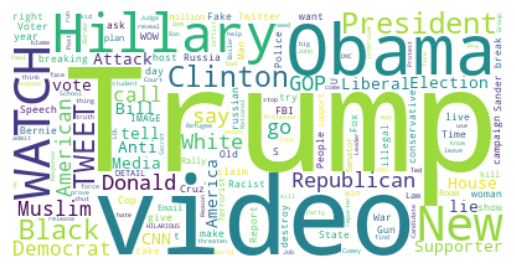

In [55]:
# Fake news title word cloud

fake_title_cloud = " ".join(title for title in fake_df.title_cleaned)

# Creating word_cloud with text as argument in .generate() method
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(fake_title_cloud)

# Display the generated Word Cloud
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [56]:
# Number of fake news with the word 'video' in title
count = 0
for title in fake_df.title_cleaned:
    title_lower = title.lower()
    title_list = title_lower.split()
    if 'video' in title_list or 'videos' in title_list:
        count +=1

count/len(fake_df.index)

0.3424072984108299

In [57]:
# Number of fake news with the word 'watch' in title

count = 0
for title in fake_df.title_cleaned:
    title_lower = title.lower()
    title_list = title_lower.split()
    if 'watch' in title_list:
        count +=1

count/len(fake_df.index)

0.08877771237983127

In [58]:
fake_df[fake_df['title_cleaned'].str.contains("video")]['title'].iloc[0]

'SNL Hilariously Mocks Accused Child Molester Roy Moore For Losing AL Senate Race (VIDEO)'

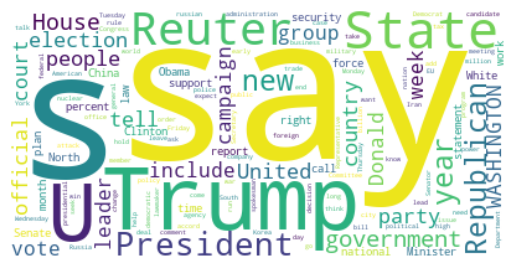

In [59]:
# Real news text word cloud

real_text_cloud = " ".join(title for title in real_df.text_cleaned)

# Creating word_cloud with text as argument in .generate() method
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(real_text_cloud)

# Display the generated Word Cloud
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

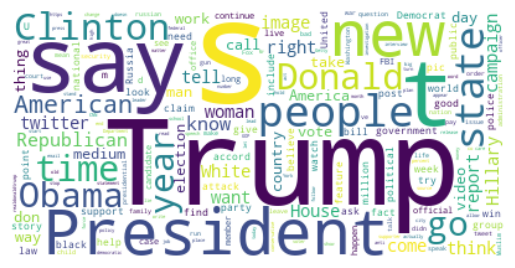

In [60]:
# Fake news text word cloud
fake_text_cloud = " ".join(title for title in fake_df.text_cleaned)

# Creating word_cloud with text as argument in .generate() method
word_cloud = WordCloud(collocations = False, background_color = 'white').generate(fake_text_cloud)

# Display the generated Word Cloud
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Analysis: Real news has the word 'reuter' in their texts but not for fake news. 

In [61]:
# remove bias: removing the word 'video' from title 
df['title_cleaned_filtered'] = df['title_cleaned'].str.replace(" video ", " ")


/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/2927146837.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [62]:
# remove bias: removing the publication name reuters at the start of the text 

def find_reuters(row):
    reuters_index = row.find("Reuters")
    if reuters_index >= 0:
        return row[reuters_index+8:]
    else:
        return row

text_with_reuters =  df['text_cleaned'].apply(find_reuters)

df['text_cleaned_filtered'] = np.where(df['text'].str.contains('Reuters) - ', regex=False) == True, text_with_reuters, df['text_cleaned'])
df

/var/folders/6g/2gnf02z56_3fdvcj9dlyc0gc0000gn/T/ipykernel_22019/2703703860.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,title,text,real_or_fake,title_cleaned,text_cleaned,title_cleaned_filtered,text_cleaned_filtered
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,real,U.S. budget fight loom Republicans flip fiscal...,WASHINGTON Reuters head conservative republica...,U.S. budget fight loom Republicans flip fiscal...,head conservative republican faction U.S. Cong...
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,real,U.S. military accept transgender recruit Monda...,WASHINGTON Reuters Transgender people allow ti...,U.S. military accept transgender recruit Monda...,Transgender people allow time enlist U.S. mili...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,real,senior U.S. republican senator let Mr. Mueller...,WASHINGTON Reuters special counsel investigati...,senior U.S. republican senator let Mr. Mueller...,special counsel investigation link Russia Pres...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,real,FBI Russia probe help australian diplomat tip NYT,WASHINGTON Reuters trump campaign adviser Geor...,FBI Russia probe help australian diplomat tip NYT,trump campaign adviser George Papadopoulos tel...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,real,trump want Postal Service charge Amazon shipment,SEATTLE WASHINGTON Reuters President Donald Tr...,trump want Postal Service charge Amazon shipment,President Donald Trump call U.S. Postal Servic...
...,...,...,...,...,...,...,...
41799,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,fake,mcpain John McCain Furious Iran Treated sailor,21st Century Wire say 21wire report early week...,mcpain John McCain Furious Iran Treated sailor,21st Century Wire say 21wire report early week...
41800,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,fake,justice Yahoo Settles e mail Privacy Class act...,21st Century Wire say s familiar theme dispute...,justice Yahoo Settles e mail Privacy Class act...,21st Century Wire say s familiar theme dispute...
41801,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,fake,Sunnistan Allied Safe Zone plan Territorial Bo...,Patrick Henningsen 21st Century WireRemember...,Sunnistan Allied Safe Zone plan Territorial Bo...,Patrick Henningsen 21st Century WireRemember...
41802,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,fake,blow $ 700 million Al Jazeera America finally ...,21st Century Wire say Al Jazeera America histo...,blow $ 700 million Al Jazeera America finally ...,21st Century Wire say Al Jazeera America histo...


In [63]:
df[df['text_cleaned_filtered'].isna()]

,title,text,real_or_fake,title_cleaned,text_cleaned,title_cleaned_filtered,text_cleaned_filtered


# Save cleaned data to csv

In [64]:
df.to_csv('cleaned_data.csv', index=False)